In [1]:
import pandas as pd


In [2]:
df = pd.read_csv("../Process Outliers/Outliers_Processed_Leads.csv")


In [3]:
df


,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,Tags,Lead Profile,City,A free copy of Mastering The Interview,Last Notable Activity
0,API,Chat,No,No,0,0.0,0,0.00,Page Visited on Website,Not Specified,Unemployed,Interested in other courses,Not Specified,Not Specified,No,Modified
1,API,Organic Search,No,No,0,5.0,674,2.50,Email Opened,Not Specified,Unemployed,Ringing,Not Specified,Not Specified,No,Email Opened
2,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.00,Email Opened,Business Administration,Student,Will revert after reading the email,Potential Lead,Mumbai,Yes,Email Opened
3,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.00,Unreachable,Marketing & Advertising,Unemployed,Ringing,Not Specified,Mumbai,No,Modified
4,Landing Page Submission,Google,No,No,1,2.0,1428,1.00,Converted to Lead,Not Specified,Unemployed,Will revert after reading the email,Not Specified,Mumbai,No,Modified
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7685,Landing Page Submission,Direct Traffic,Yes,No,1,8.0,1845,2.67,Other,IT Projects Management,Unemployed,Will revert after reading the email,Potential Lead,Mumbai,No,Other
7686,Landing Page Submission,Direct Traffic,No,No,0,2.0,238,2.00,SMS Sent,Marketing & Advertising,Unemployed,invalid number,Potential Lead,Mumbai,Yes,SMS Sent
7687,Landing Page Submission,Direct Traffic,Yes,No,0,2.0,199,2.00,SMS Sent,Business Administration,Unemployed,invalid number,Potential Lead,Mumbai,Yes,SMS Sent
7688,Landing Page Submission,Google,No,No,1,3.0,499,3.00,SMS Sent,Human Resource Management,Not Specified,Not Specified,Not Specified,Other Metro Cities,No,SMS Sent


In [4]:
# Xem kiểu dữ liệu từng cột
print(df.dtypes)

# Phân loại cột category và continuous
category_cols = []
continuous_cols = []

for col in df.columns:
    # Nếu là object hoặc có ít giá trị unique thì xem là category
    if df[col].dtype == 'object' or df[col].nunique() < 20:
        if col != 'Converted' and col != 'TotalVisits':  # Bỏ qua cột target và cột TotalVisits vì nó là continuous
            category_cols.append(col)
    else:
        continuous_cols.append(col)

print("Categorical columns:")
print(category_cols)

print("\nContinuous columns:")
continuous_cols.append('TotalVisits')  # Thêm cột TotalVisits vào danh sách continuous
print(continuous_cols)


Lead Origin                                object
Lead Source                                object
Do Not Email                               object
Do Not Call                                object
Converted                                   int64
TotalVisits                               float64
Total Time Spent on Website                 int64
Page Views Per Visit                      float64
Last Activity                              object
Specialization                             object
What is your current occupation            object
Tags                                       object
Lead Profile                               object
City                                       object
A free copy of Mastering The Interview     object
Last Notable Activity                      object
dtype: object
Categorical columns:
['Lead Origin', 'Lead Source', 'Do Not Email', 'Do Not Call', 'Last Activity', 'Specialization', 'What is your current occupation', 'Tags', 'Lead Profile', 'City', '

In [5]:
labels = df['Converted']


Skewness Checking

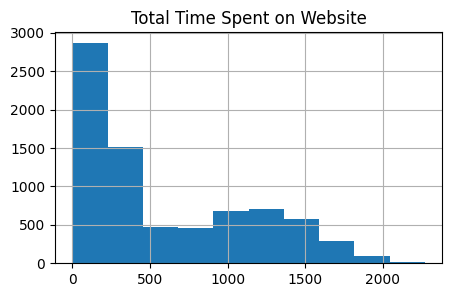

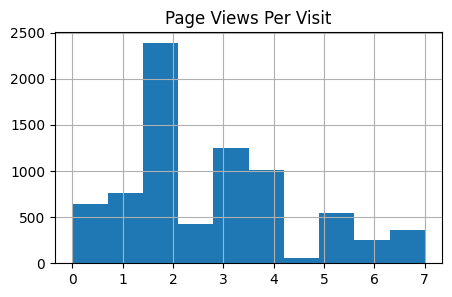

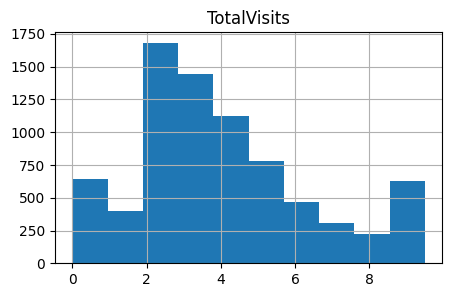

In [6]:
import matplotlib.pyplot as plt

for col in continuous_cols:
    plt.figure(figsize=(5, 3))
    df[col].hist(bins=10)
    plt.title(col)
    plt.show()


In [7]:
# Kiểm tra skewness
for col in continuous_cols:
    skewness = df[col].skew()
    print(f"Skewness of {col}: {skewness}")


Skewness of Total Time Spent on Website: 0.7318973584459149
Skewness of Page Views Per Visit: 0.6563151406884671
Skewness of TotalVisits: 0.7290377303080695


Dữ liệu không bị quá lệch nếu giá trị tuyệt đối của hệ số skewness nhỏ hơn 1. Nếu hệ số skewness lớn hơn 1 hoặc nhỏ hơn -1, dữ liệu được coi là bị lệch mạnh. Nếu hệ số skewness nằm giữa -1 và -0.5 hoặc giữa 0.5 và 1, dữ liệu được coi là bị lệch nhẹ. Nếu hệ số skewness nằm giữa -0.5 và 0.5, dữ liệu được coi là gần như đối xứng.

# **1. Encoding các cột category**

In [8]:
from sklearn.preprocessing import LabelEncoder

# Tạo bản sao để không làm thay đổi df gốc
df_encoded = df.copy()

# Lưu lại encoder của từng cột nếu sau này cần inverse_transform
label_encoders = {}

for col in category_cols:
    le = LabelEncoder()
    
    # Chuyển về string để tránh lỗi nếu có NaN hoặc kiểu mixed
    df_encoded[col] = le.fit_transform(df_encoded[col].astype(str))
    
    label_encoders[col] = le

# Kết quả
df_encoded.head()


,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,Tags,Lead Profile,City,A free copy of Mastering The Interview,Last Notable Activity
0,0,0,0,0,0,0.0,0,0.0,7,10,3,5,0,1,0,2
1,0,3,0,0,0,5.0,674,2.5,3,10,3,9,0,1,0,1
2,1,1,0,0,1,2.0,1532,2.0,3,1,2,11,3,0,1,1
3,1,1,0,0,0,1.0,305,1.0,10,9,3,9,0,0,0,2
4,1,2,0,0,1,2.0,1428,1.0,0,10,3,11,0,0,0,2


In [9]:
for col, le in label_encoders.items():
    print(f"\nColumn: {col}")
    mapping = dict(zip(le.classes_, le.transform(le.classes_)))
    print(mapping)



Column: Lead Origin
{'API': np.int64(0), 'Landing Page Submission': np.int64(1), 'Lead Add Form': np.int64(2), 'Other': np.int64(3)}

Column: Lead Source
{'Chat': np.int64(0), 'Direct Traffic': np.int64(1), 'Google': np.int64(2), 'Organic Search': np.int64(3), 'Other': np.int64(4), 'Referral': np.int64(5)}

Column: Do Not Email
{'No': np.int64(0), 'Yes': np.int64(1)}

Column: Do Not Call
{'No': np.int64(0), 'Yes': np.int64(1)}

Column: Last Activity
{'Converted to Lead': np.int64(0), 'Email Bounced': np.int64(1), 'Email Link Clicked': np.int64(2), 'Email Opened': np.int64(3), 'Form Submitted on Website': np.int64(4), 'Olark Chat Conversation': np.int64(5), 'Other': np.int64(6), 'Page Visited on Website': np.int64(7), 'SMS Sent': np.int64(8), 'Unknown': np.int64(9), 'Unreachable': np.int64(10)}

Column: Specialization
{'Banking, Investment And Insurance': np.int64(0), 'Business Administration': np.int64(1), 'E-Commerce': np.int64(2), 'Finance & Banking': np.int64(3), 'Healthcare Manage

# **2. Ma trận tương quan Pearson**

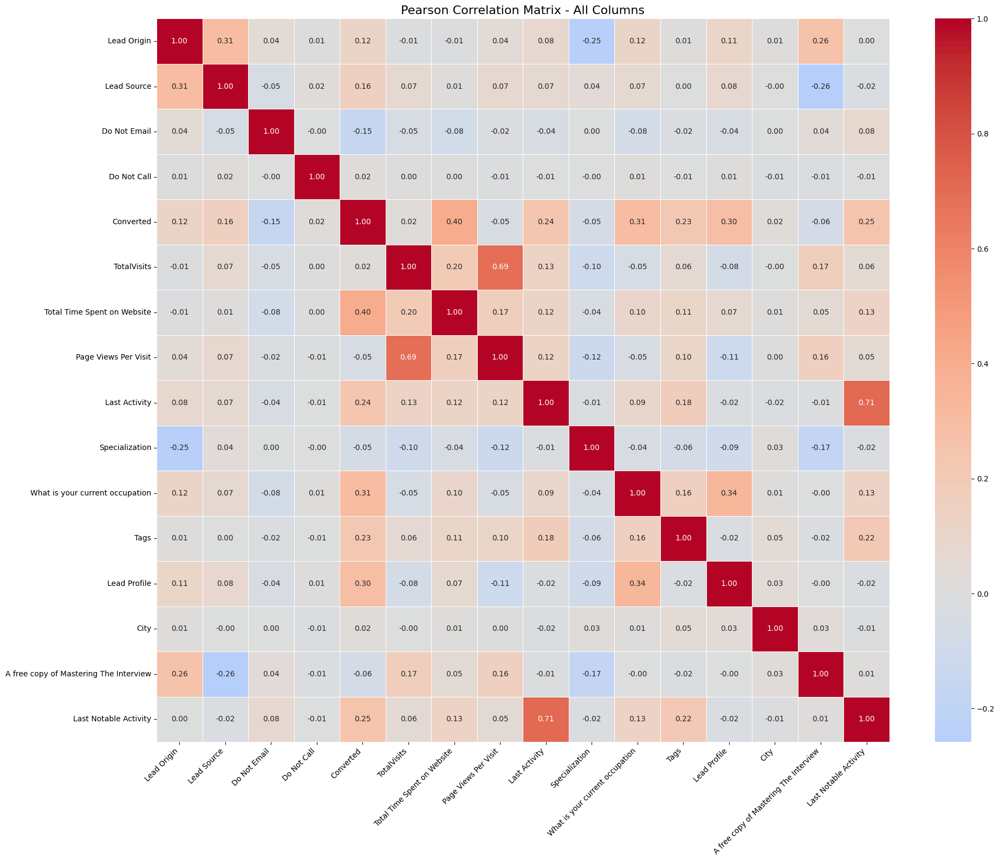

In [10]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Nếu muốn lấy toàn bộ cột, kể cả category đã encode
corr_matrix = df_encoded.corr(method='pearson', numeric_only=True)

# Vẽ heatmap
plt.figure(figsize=(20, 16))
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    linewidths=0.5
)

plt.title('Pearson Correlation Matrix - All Columns', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


# **3. Feature Engineering**

## **a. Các cột liên tục**

### Polynomial Features

In [11]:
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(
    degree=2,
    interaction_only=True,
    include_bias=False
)

temp = poly.fit_transform(df_encoded[continuous_cols])


In [12]:
continuous_cols


['Total Time Spent on Website', 'Page Views Per Visit', 'TotalVisits']

In [13]:
pd.DataFrame(poly.powers_, columns=['tttspow_degree',  
                                  'pvps_degree',
                                  'totalvisits_degree'])


,tttspow_degree,pvps_degree,totalvisits_degree
0,1,0,0
1,0,1,0
2,0,0,1
3,1,1,0
4,1,0,1
5,0,1,1


In [14]:
intr_features = pd.DataFrame(temp, columns=['Total Time Spent on Website', 'Page Views Per Visit',  
                                           'TotalVisits', 
                                           'ttspow_pvps',  
                                           'tttspow_totalvisits',
                                           'pvps_totalvisits'])
intr_features.head(5)


,Total Time Spent on Website,Page Views Per Visit,TotalVisits,ttspow_pvps,tttspow_totalvisits,pvps_totalvisits
0,0.0,0.0,0.0,0.0,0.0,0.0
1,674.0,2.5,5.0,1685.0,3370.0,12.5
2,1532.0,2.0,2.0,3064.0,3064.0,4.0
3,305.0,1.0,1.0,305.0,305.0,1.0
4,1428.0,1.0,2.0,1428.0,2856.0,2.0


In [15]:
intr_features.drop(columns=['Total Time Spent on Website', 'Page Views Per Visit', 'TotalVisits'], inplace=True)
intr_features.head(5)


,ttspow_pvps,tttspow_totalvisits,pvps_totalvisits
0,0.0,0.0,0.0
1,1685.0,3370.0,12.5
2,3064.0,3064.0,4.0
3,305.0,305.0,1.0
4,1428.0,2856.0,2.0


In [16]:
X = pd.concat([df_encoded, intr_features], axis=1)
X.head()


,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,Tags,Lead Profile,City,A free copy of Mastering The Interview,Last Notable Activity,ttspow_pvps,tttspow_totalvisits,pvps_totalvisits
0,0,0,0,0,0,0.0,0,0.0,7,10,3,5,0,1,0,2,0.0,0.0,0.0
1,0,3,0,0,0,5.0,674,2.5,3,10,3,9,0,1,0,1,1685.0,3370.0,12.5
2,1,1,0,0,1,2.0,1532,2.0,3,1,2,11,3,0,1,1,3064.0,3064.0,4.0
3,1,1,0,0,0,1.0,305,1.0,10,9,3,9,0,0,0,2,305.0,305.0,1.0
4,1,2,0,0,1,2.0,1428,1.0,0,10,3,11,0,0,0,2,1428.0,2856.0,2.0


### Manual Feature Engineering

#### Đặc trưng "Time_Per_Page"

In [17]:
X["Time_Per_Page"] = (
    X["Total Time Spent on Website"] /
    (X["Page Views Per Visit"] + 1)
)
X.head()


,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,Tags,Lead Profile,City,A free copy of Mastering The Interview,Last Notable Activity,ttspow_pvps,tttspow_totalvisits,pvps_totalvisits,Time_Per_Page
0,0,0,0,0,0,0.0,0,0.0,7,10,3,5,0,1,0,2,0.0,0.0,0.0,0.000000
1,0,3,0,0,0,5.0,674,2.5,3,10,3,9,0,1,0,1,1685.0,3370.0,12.5,192.571429
2,1,1,0,0,1,2.0,1532,2.0,3,1,2,11,3,0,1,1,3064.0,3064.0,4.0,510.666667
3,1,1,0,0,0,1.0,305,1.0,10,9,3,9,0,0,0,2,305.0,305.0,1.0,152.500000
4,1,2,0,0,1,2.0,1428,1.0,0,10,3,11,0,0,0,2,1428.0,2856.0,2.0,714.000000


Đặc trưng "Time_Per_Page" được tạo ra bằng cách chia "Total Time Spent on Website" cho "Page Views Per Visit" cộng thêm 1 (để tránh chia cho 0). Đây là một đặc trưng mới có thể giúp mô hình hiểu rõ hơn về thời gian trung bình mà người dùng dành cho mỗi trang trên website, từ đó có thể cải thiện hiệu suất dự đoán.

#### Đặc trưng "Time Per Visit"

In [18]:
X["Time_Per_Visit"] = (
    X["Total Time Spent on Website"] /
    (X["TotalVisits"] + 1)
)
X.head()


,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,...,Tags,Lead Profile,City,A free copy of Mastering The Interview,Last Notable Activity,ttspow_pvps,tttspow_totalvisits,pvps_totalvisits,Time_Per_Page,Time_Per_Visit
0,0,0,0,0,0,0.0,0,0.0,7,10,...,5,0,1,0,2,0.0,0.0,0.0,0.000000,0.000000
1,0,3,0,0,0,5.0,674,2.5,3,10,...,9,0,1,0,1,1685.0,3370.0,12.5,192.571429,112.333333
2,1,1,0,0,1,2.0,1532,2.0,3,1,...,11,3,0,1,1,3064.0,3064.0,4.0,510.666667,510.666667
3,1,1,0,0,0,1.0,305,1.0,10,9,...,9,0,0,0,2,305.0,305.0,1.0,152.500000,152.500000
4,1,2,0,0,1,2.0,1428,1.0,0,10,...,11,0,0,0,2,1428.0,2856.0,2.0,714.000000,476.000000


Đặc trưng "Time_Per_Page" được tạo ra bằng cách chia "Total Time Spent on Website" cho "Page Views Per Visit" cộng thêm 1 (để tránh chia cho 0). Đây là một đặc trưng mới có thể giúp mô hình hiểu rõ hơn về hành vi của người dùng trên trang web, cụ thể là thời gian trung bình mà họ dành cho mỗi trang.

#### Đặc trưng "Engagement_Score"

In [19]:
X["Engagement_Score"] = (
    X["TotalVisits"] * 0.25 +
    X["Page Views Per Visit"] * 0.25 +
    X["Total Time Spent on Website"] * 0.5
)
X.head()


,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,...,Lead Profile,City,A free copy of Mastering The Interview,Last Notable Activity,ttspow_pvps,tttspow_totalvisits,pvps_totalvisits,Time_Per_Page,Time_Per_Visit,Engagement_Score
0,0,0,0,0,0,0.0,0,0.0,7,10,...,0,1,0,2,0.0,0.0,0.0,0.000000,0.000000,0.000
1,0,3,0,0,0,5.0,674,2.5,3,10,...,0,1,0,1,1685.0,3370.0,12.5,192.571429,112.333333,338.875
2,1,1,0,0,1,2.0,1532,2.0,3,1,...,3,0,1,1,3064.0,3064.0,4.0,510.666667,510.666667,767.000
3,1,1,0,0,0,1.0,305,1.0,10,9,...,0,0,0,2,305.0,305.0,1.0,152.500000,152.500000,153.000
4,1,2,0,0,1,2.0,1428,1.0,0,10,...,0,0,0,2,1428.0,2856.0,2.0,714.000000,476.000000,714.750


Đặc trưng "Engagement Score" được tạo ra bằng cách kết hợp các đặc trưng "TotalVisits", "Page Views Per Visit" và "Total Time Spent on Website" với các trọng số khác nhau (0.25, 0.25 và 0.5). Đây là một đặc trưng tổng hợp có thể giúp mô hình đánh giá mức độ tương tác của người dùng với trang web, từ đó cải thiện hiệu suất dự đoán.

#### Đặc trưng "Engagement Level"


In [20]:
X["Engagement_Level"] = (
    (X["TotalVisits"] > X["TotalVisits"].median()).astype(int) +
    (X["Total Time Spent on Website"] > X["Total Time Spent on Website"].median()).astype(int) +
    (X["Page Views Per Visit"] > X["Page Views Per Visit"].median()).astype(int)
)
X.head()


,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,...,City,A free copy of Mastering The Interview,Last Notable Activity,ttspow_pvps,tttspow_totalvisits,pvps_totalvisits,Time_Per_Page,Time_Per_Visit,Engagement_Score,Engagement_Level
0,0,0,0,0,0,0.0,0,0.0,7,10,...,1,0,2,0.0,0.0,0.0,0.000000,0.000000,0.000,0
1,0,3,0,0,0,5.0,674,2.5,3,10,...,1,0,1,1685.0,3370.0,12.5,192.571429,112.333333,338.875,3
2,1,1,0,0,1,2.0,1532,2.0,3,1,...,0,1,1,3064.0,3064.0,4.0,510.666667,510.666667,767.000,1
3,1,1,0,0,0,1.0,305,1.0,10,9,...,0,0,2,305.0,305.0,1.0,152.500000,152.500000,153.000,0
4,1,2,0,0,1,2.0,1428,1.0,0,10,...,0,0,2,1428.0,2856.0,2.0,714.000000,476.000000,714.750,1


Đặc trưng "Engagement Level" được tạo ra bằng cách đánh giá xem mỗi đặc trưng "TotalVisits", "Total Time Spent on Website" và "Page Views Per Visit" có lớn hơn giá trị trung vị của chúng hay không. Mỗi đặc trưng sẽ đóng góp 1 điểm nếu nó lớn hơn giá trị trung vị, và tổng điểm sẽ được sử dụng để xác định mức độ tương tác của người dùng. Đây là một cách tiếp cận đơn giản nhưng hiệu quả để phân loại người dùng thành các nhóm tương tác khác nhau, từ đó giúp mô hình dự đoán tốt hơn về khả năng chuyển đổi của họ.

## **b. Các cột category**

**Tạo các features counting mới dựa trên tần suất xuất hiện của các tổ hợp category trong các cột category.**

In [21]:
category_cols


['Lead Origin',
 'Lead Source',
 'Do Not Email',
 'Do Not Call',
 'Last Activity',
 'Specialization',
 'What is your current occupation',
 'Tags',
 'Lead Profile',
 'City',
 'A free copy of Mastering The Interview',
 'Last Notable Activity']

In [22]:
from itertools import combinations

all_combinations = []

for r in range(2, len(category_cols) + 1):
    comb_list = list(combinations(category_cols, r))
    all_combinations.extend(comb_list)

pd.DataFrame(all_combinations)


,0,1,2,3,4,5,6,7,8,9,10,11
0,Lead Origin,Lead Source,None,None,None,None,None,None,None,None,None,None
1,Lead Origin,Do Not Email,None,None,None,None,None,None,None,None,None,None
2,Lead Origin,Do Not Call,None,None,None,None,None,None,None,None,None,None
3,Lead Origin,Last Activity,None,None,None,None,None,None,None,None,None,None
4,Lead Origin,Specialization,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...
4078,Lead Origin,Lead Source,Do Not Email,Last Activity,Specialization,What is your current occupation,Tags,Lead Profile,City,A free copy of Mastering The Interview,Last Notable Activity,None
4079,Lead Origin,Lead Source,Do Not Call,Last Activity,Specialization,What is your current occupation,Tags,Lead Profile,City,A free copy of Mastering The Interview,Last Notable Activity,None
4080,Lead Origin,Do Not Email,Do Not Call,Last Activity,Specialization,What is your current occupation,Tags,Lead Profile,City,A free copy of Mastering The Interview,Last Notable Activity,None
4081,Lead Source,Do Not Email,Do Not Call,Last Activity,Specialization,What is your current occupation,Tags,Lead Profile,City,A free copy of Mastering The Interview,Last Notable Activity,None


In [23]:
# Tạo feature bin counting cho từng tổ hợp
for comb in all_combinations:
    
    # Tạo tên feature mới
    new_col_name = '_'.join(comb) + '_count'
    
    # Ghép các category trong tổ hợp thành 1 chuỗi
    combined_values = X[list(comb)].astype(str).agg('_'.join, axis=1) # Logic dòng này : Đầu tiên, X[list(comb)] sẽ lấy ra các cột tương ứng với tổ hợp hiện tại. Sau đó, .astype(str) chuyển tất cả giá trị trong những cột này thành chuỗi để đảm bảo rằng chúng có thể được nối lại với nhau. Cuối cùng, .agg('_'.join, axis=1) sẽ nối các giá trị của từng hàng lại với nhau bằng dấu gạch dưới '_', tạo thành một chuỗi duy nhất đại diện cho tổ hợp của các category trong hàng đó.. KẾt quả là một Series mới, trong đó mỗi giá trị là sự kết hợp của các category trong tổ hợp hiện tại, được nối lại với nhau bằng dấu gạch dưới và được lưu trong biến combined_values.
    
    # Đếm tần suất xuất hiện của từng tổ hợp
    freq_map = combined_values.value_counts()
    
    # Map lại vào dataframe
    X[new_col_name] = combined_values.map(freq_map)

# Xem thử vài cột mới
X.filter(like='_count').head()


/var/folders/36/khn_y8zn7qqflczfpst8cbfc0000gn/T/ipykernel_80171/1571654669.py:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X[new_col_name] = combined_values.map(freq_map)
/var/folders/36/khn_y8zn7qqflczfpst8cbfc0000gn/T/ipykernel_80171/1571654669.py:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X[new_col_name] = combined_values.map(freq_map)
/var/folders/36/khn_y8zn7qqflczfpst8cbfc0000gn/T/ipykernel_80171/1571654669.py:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame

,Lead Origin_Lead Source_count,Lead Origin_Do Not Email_count,Lead Origin_Do Not Call_count,Lead Origin_Last Activity_count,Lead Origin_Specialization_count,Lead Origin_What is your current occupation_count,Lead Origin_Tags_count,Lead Origin_Lead Profile_count,Lead Origin_City_count,Lead Origin_A free copy of Mastering The Interview_count,...,Lead Origin_Lead Source_Do Not Email_Do Not Call_Last Activity_Specialization_What is your current occupation_Tags_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Origin_Lead Source_Do Not Email_Do Not Call_Last Activity_Specialization_What is your current occupation_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Origin_Lead Source_Do Not Email_Do Not Call_Last Activity_Specialization_Tags_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Origin_Lead Source_Do Not Email_Do Not Call_Last Activity_What is your current occupation_Tags_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Origin_Lead Source_Do Not Email_Do Not Call_Specialization_What is your current occupation_Tags_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Origin_Lead Source_Do Not Email_Last Activity_Specialization_What is your current occupation_Tags_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Origin_Lead Source_Do Not Call_Last Activity_Specialization_What is your current occupation_Tags_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Origin_Do Not Email_Do Not Call_Last Activity_Specialization_What is your current occupation_Tags_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Source_Do Not Email_Do Not Call_Last Activity_Specialization_What is your current occupation_Tags_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Origin_Lead Source_Do Not Email_Do Not Call_Last Activity_Specialization_What is your current occupation_Tags_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count
0,489,2180,2314,169,1670,1449,228,1729,1826,2189,...,1,1,2,1,6,1,1,10,1,1
1,456,2180,2314,839,1670,1449,245,1729,1826,2189,...,23,52,21,22,21,21,21,68,22,21
2,2433,4378,4885,1936,339,111,1152,821,2793,2744,...,1,1,3,2,1,1,1,1,1,1
3,2433,4378,4885,63,791,3155,843,3591,2793,2141,...,1,1,1,2,3,1,1,1,1,1
4,1714,4378,4885,266,125,3155,1152,3591,2793,2141,...,1,2,1,1,3,1,1,1,1,1


In [24]:
count_cols = [col for col in X.columns if col.endswith('_count')]
len(count_cols)


4083

# **4. Scaling dữ liệu**

Tiến hành scale các cột count mới tạo ra bằng StandardScaler

In [25]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
cols_to_scale = count_cols + continuous_cols + ['Time_Per_Page', 'Time_Per_Visit', 'Engagement_Score', 'Engagement_Level']
X[cols_to_scale] = scaler.fit_transform(X[cols_to_scale])

X.head()


,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,...,Lead Origin_Lead Source_Do Not Email_Do Not Call_Last Activity_Specialization_What is your current occupation_Tags_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Origin_Lead Source_Do Not Email_Do Not Call_Last Activity_Specialization_What is your current occupation_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Origin_Lead Source_Do Not Email_Do Not Call_Last Activity_Specialization_Tags_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Origin_Lead Source_Do Not Email_Do Not Call_Last Activity_What is your current occupation_Tags_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Origin_Lead Source_Do Not Email_Do Not Call_Specialization_What is your current occupation_Tags_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Origin_Lead Source_Do Not Email_Last Activity_Specialization_What is your current occupation_Tags_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Origin_Lead Source_Do Not Call_Last Activity_Specialization_What is your current occupation_Tags_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Origin_Do Not Email_Do Not Call_Last Activity_Specialization_What is your current occupation_Tags_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Source_Do Not Email_Do Not Call_Last Activity_Specialization_What is your current occupation_Tags_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Origin_Lead Source_Do Not Email_Do Not Call_Last Activity_Specialization_What is your current occupation_Tags_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count
0,0,0,0,0,0,-1.502827,-1.063677,-1.612033,7,10,...,-0.388294,-0.438410,-0.282082,-0.566190,-0.131094,-0.353163,-0.363675,-0.039133,-0.362712,-0.353163
1,0,3,0,0,0,0.480448,0.160288,-0.149031,3,10,...,1.254734,1.787062,0.592637,0.409502,0.483509,1.155796,1.126525,2.217095,1.215431,1.155796
2,1,1,0,0,1,-0.709517,1.718392,-0.441631,3,1,...,-0.388294,-0.438410,-0.236044,-0.519728,-0.335962,-0.353163,-0.363675,-0.389238,-0.362712,-0.353163
3,1,1,0,0,0,-1.106172,-0.509805,-1.026832,10,9,...,-0.388294,-0.438410,-0.328120,-0.519728,-0.254015,-0.353163,-0.363675,-0.389238,-0.362712,-0.353163
4,1,2,0,0,1,-0.709517,1.529531,-1.026832,0,10,...,-0.388294,-0.394773,-0.328120,-0.566190,-0.254015,-0.353163,-0.363675,-0.389238,-0.362712,-0.353163


In [ ]:
X['Converted'] = labels
X.to_csv("Leads_Engineered_Scaled.csv", index=False)


In [27]:
X


,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,...,Lead Origin_Lead Source_Do Not Email_Do Not Call_Last Activity_Specialization_What is your current occupation_Tags_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Origin_Lead Source_Do Not Email_Do Not Call_Last Activity_Specialization_What is your current occupation_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Origin_Lead Source_Do Not Email_Do Not Call_Last Activity_Specialization_Tags_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Origin_Lead Source_Do Not Email_Do Not Call_Last Activity_What is your current occupation_Tags_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Origin_Lead Source_Do Not Email_Do Not Call_Specialization_What is your current occupation_Tags_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Origin_Lead Source_Do Not Email_Last Activity_Specialization_What is your current occupation_Tags_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Origin_Lead Source_Do Not Call_Last Activity_Specialization_What is your current occupation_Tags_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Origin_Do Not Email_Do Not Call_Last Activity_Specialization_What is your current occupation_Tags_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Source_Do Not Email_Do Not Call_Last Activity_Specialization_What is your current occupation_Tags_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count,Lead Origin_Lead Source_Do Not Email_Do Not Call_Last Activity_Specialization_What is your current occupation_Tags_Lead Profile_City_A free copy of Mastering The Interview_Last Notable Activity_count
0,0,0,0,0,0,-1.502827,-1.063677,-1.612033,7,10,...,-0.388294,-0.438410,-0.282082,-0.566190,-0.131094,-0.353163,-0.363675,-0.039133,-0.362712,-0.353163
1,0,3,0,0,0,0.480448,0.160288,-0.149031,3,10,...,1.254734,1.787062,0.592637,0.409502,0.483509,1.155796,1.126525,2.217095,1.215431,1.155796
2,1,1,0,0,1,-0.709517,1.718392,-0.441631,3,1,...,-0.388294,-0.438410,-0.236044,-0.519728,-0.335962,-0.353163,-0.363675,-0.389238,-0.362712,-0.353163
3,1,1,0,0,0,-1.106172,-0.509805,-1.026832,10,9,...,-0.388294,-0.438410,-0.328120,-0.519728,-0.254015,-0.353163,-0.363675,-0.389238,-0.362712,-0.353163
4,1,2,0,0,1,-0.709517,1.529531,-1.026832,0,10,...,-0.388294,-0.394773,-0.328120,-0.566190,-0.254015,-0.353163,-0.363675,-0.389238,-0.362712,-0.353163
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7685,1,1,1,0,1,1.670412,2.286791,-0.049547,6,7,...,-0.388294,-0.438410,-0.328120,-0.566190,-0.335962,-0.353163,-0.363675,-0.389238,-0.362712,-0.353163
7686,1,1,0,0,0,-0.709517,-0.631476,-0.441631,8,9,...,-0.014878,-0.220226,-0.328120,-0.566190,-0.335962,-0.353163,-0.363675,-0.389238,-0.362712,-0.353163
7687,1,1,1,0,0,-0.709517,-0.702298,-0.441631,8,1,...,-0.313611,-0.438410,-0.328120,-0.519728,-0.335962,-0.353163,-0.363675,-0.389238,-0.362712,-0.353163
7688,1,2,0,0,1,-0.312862,-0.157507,0.143570,8,6,...,-0.388294,-0.438410,-0.328120,-0.380344,-0.335962,-0.353163,-0.363675,-0.389238,-0.362712,-0.353163
